<h1><center> OpenCV Practice </center></h1>

Practicing some basics of computer vision with Opencv Bootcamp

This is a lousy notebook not intended for others to study nor read xD
all materials available at OpenCV bootcamp course (which is free) (all materials are deleted also)

In [3]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import os
from IPython.display import Image
import sys

## Just displaying Images

In [4]:
Image(filename="checkerboard_18x18.png")


In [ ]:
Image(filename="checkerboard_84x84.jpg")


## Exploring Color changing and ordering

In [ ]:
#Reading with OpenCV
img_1=cv.imread('checkerboard_18x18.png',0) # flag=0 for grayscale mode
print(img_1)
cv.imshow('Img',img_1)
cv.waitKey(0)                               # Window must be manually closed
cv.destroyAllWindows()
plt.imshow(img_1,cmap='gray')

### Changing some pixels

In [ ]:
tmp_img=img_1.copy()
tmp_img[1:5,1:5]=200
print(tmp_img)

plt.imshow(tmp_img,cmap='gray')

In [ ]:
img_2=cv.imread('checkerboard_fuzzy_18x18.jpg',0)
print(img_2)
cv.imshow('Img',img_2)
cv.waitKey(0)                               # Window must be manually closed
cv.destroyAllWindows()
plt.imshow(img_2,cmap='gray')

In [ ]:
#Image('coca-cola-logo.png')
img_3=cv.imread('coca-cola-logo.png',1)
print(img_3.shape,img_3.dtype)
plt.imshow(img_3[:,:,::-1])

In [ ]:
# Split the image into the B,G,R components
img_NZ_bgr = cv.imread("New_Zealand_Lake.jpg", cv.IMREAD_COLOR)
b, g, r = cv.split(img_NZ_bgr)
print(b.shape,g.shape,r.shape,img_NZ_bgr.shape)

# Show the channels
plt.figure(figsize=[20, 5])

plt.subplot(141);plt.imshow(r);plt.title("Red Channel")
plt.subplot(142);plt.imshow(g);plt.title("Green Channel")
plt.subplot(143);plt.imshow(b);plt.title("Blue Channel")

# Merge the individual channels into a BGR image
imgMerged = cv.merge((b, g, r))
# Show the merged output
plt.subplot(144)
plt.imshow(imgMerged[:, :, ::-1])
plt.title("Merged Output")

In [ ]:
img_NZ_rgb = cv.cvtColor(img_NZ_bgr, 1)
img_NZ_rgb_2 = cv.cvtColor(img_NZ_bgr, cv.COLOR_BGR2RGB)
plt.figure(figsize=[20, 5])

plt.subplot(141);plt.imshow(img_NZ_rgb);plt.title("BGR Order")
plt.subplot(142);plt.imshow(img_NZ_rgb_2);plt.title("RGB Order")


In [ ]:
img_hsv = cv.cvtColor(img_NZ_bgr, cv.COLOR_BGR2HSV)

# Split the image into the B,G,R components
h,s,v = cv.split(img_hsv)

# Show the channels
plt.figure(figsize=[20,5])
plt.subplot(141);plt.imshow(h+10, cmap="gray");plt.title("H Channel");
plt.subplot(142);plt.imshow(s+100, cmap="gray");plt.title("S Channel");
plt.subplot(143);plt.imshow(v, cmap="gray");plt.title("V Channel");
plt.subplot(144);plt.imshow(img_NZ_rgb_2);   plt.title("Original");

In [ ]:
#Saving
img_merged=cv.cvtColor(cv.merge((h-10,s+50,v-5)),cv.COLOR_HSV2BGR) #merging the image after performing some manuplation

reduced=cv.resize(img_merged,(int(img_NZ_rgb.shape[1]*0.3),int(img_NZ_rgb.shape[0]*0.3)))
cv.imwrite('H CHannel.png',reduced)
print(reduced.shape)
Image('H CHannel.png')

In [ ]:
resized=cv.resize(reduced,None,fx=3,fy=3)
plt.imshow(resized[:,:,::-1])

In [ ]:
img_NZ_rgb_flipped_horz = cv.flip(img_NZ_rgb, 1)
img_NZ_rgb_flipped_vert = cv.flip(img_NZ_rgb, 0)
img_NZ_rgb_flipped_both = cv.flip(img_NZ_rgb, -1)

# Show the images
plt.figure(figsize=(18, 5))
plt.subplot(141);plt.imshow(img_NZ_rgb_flipped_horz);plt.title("Horizontal Flip");
plt.subplot(142);plt.imshow(img_NZ_rgb_flipped_vert);plt.title("Vertical Flip");
plt.subplot(143);plt.imshow(img_NZ_rgb_flipped_both);plt.title("Both Flipped");
plt.subplot(144);plt.imshow(img_NZ_rgb);plt.title("Original");

### Image Annotation

In [ ]:
IMG=cv.imread('New_Zealand_Lake.jpg',cv.IMREAD_COLOR)
plt.imshow(IMG[:,:,::-1])

In [ ]:
IMG_line=IMG.copy()

cv.line(IMG_line,(0,0),(800,600),(0,255,0),10,cv.LINE_AA)
plt.imshow(IMG_line[:,:,::-1])

In [ ]:
IMG_circle=IMG.copy()

cv.circle(IMG_circle,(450,300),100,(0,255,0),10,cv.LINE_AA)
plt.imshow(IMG_circle[:,:,::-1])

In [ ]:
IMG_rec=IMG.copy()

cv.rectangle(IMG_rec,(200,200),(600,500),(0,255,0),10,cv.LINE_AA)
plt.imshow(IMG_rec[:,:,::-1])

In [ ]:
IMG_text=IMG.copy()

cv.putText(IMG_text,'Kishou San Practice',(0,330),cv.FONT_HERSHEY_SCRIPT_COMPLEX ,3,(0,0,255),2,lineType=cv.LINE_AA)
plt.imshow(IMG_text[:,:,::-1])

### Simple Image Enhancements

In [ ]:
img_bgr = cv.imread("New_Zealand_Coast.jpg", cv.IMREAD_COLOR)
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

# Display 18x18 pixel image.
Image(filename="New_Zealand_Coast.jpg")

In [ ]:
matrix = np.ones(img_rgb.shape, dtype="uint8") * 100

img_rgb_brighter = cv.add(img_rgb, matrix)
img_rgb_darker   = cv.subtract(img_rgb, matrix)


# Show the images
plt.figure(figsize=[18, 5])
plt.subplot(131); plt.imshow(img_rgb_darker);  plt.title("Darker");
plt.subplot(132); plt.imshow(img_rgb);         plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_brighter);plt.title("Brighter");

In [ ]:
matrix1 = np.ones(img_rgb.shape) * 0.3
matrix2 = np.ones(img_rgb.shape) * 1.7

img_rgb_lower  = np.uint8(cv.multiply(np.float64(img_rgb), matrix1))
img_rgb_higher = np.uint8(np.clip(cv.multiply(np.float64(img_rgb), matrix2), 0, 255))

# Show the images
plt.figure(figsize=[18,5])
plt.subplot(131); plt.imshow(img_rgb_lower); plt.title("Lower Contrast");
plt.subplot(132); plt.imshow(img_rgb);       plt.title("Original");
plt.subplot(133); plt.imshow(img_rgb_higher);plt.title("Higher Contrast");

In [ ]:
img_read=cv.imread('building-windows.jpg',cv.IMREAD_GRAYSCALE)
retval, img_thresh = cv.threshold(img_read,100,255,cv.THRESH_BINARY)

plt.figure(figsize=[18,5])

plt.subplot(121); plt.imshow(img_read,cmap='gray'); plt.title('Original')
plt.subplot(122); plt.imshow(img_thresh,cmap='gray'); plt.title('Thresholded')

plt.show()
print(retval)

In [ ]:
# Read the original image
img_read = cv.imread("Piano_Sheet_Music.png", cv.IMREAD_GRAYSCALE)

# Perform global thresholding
retval, img_thresh_gbl_1 = cv.threshold(img_read, 50, 255, cv.THRESH_BINARY)

# Perform global thresholding
retval, img_thresh_gbl_2 = cv.threshold(img_read, 130, 255, cv.THRESH_BINARY)

# Perform adaptive thresholding
img_thresh_adp = cv.adaptiveThreshold(img_read, 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY, 11, 7)

# Show the images
plt.figure(figsize=[18,15])
plt.subplot(221); plt.imshow(img_read,        cmap="gray");  plt.title("Original");
plt.subplot(222); plt.imshow(img_thresh_gbl_1,cmap="gray");  plt.title("Thresholded (global: 50)");
plt.subplot(223); plt.imshow(img_thresh_gbl_2,cmap="gray");  plt.title("Thresholded (global: 130)");
plt.subplot(224); plt.imshow(img_thresh_adp,  cmap="gray");  plt.title("Thresholded (adaptive)");

In [ ]:
img_rec = cv.imread("rectangle.jpg", cv.IMREAD_GRAYSCALE)

img_cir = cv.imread("circle.jpg", cv.IMREAD_GRAYSCALE)
print(img_cir.shape)
plt.figure(figsize=[20, 5])
plt.subplot(121);plt.imshow(img_rec, cmap="gray")
plt.subplot(122);plt.imshow(img_cir, cmap="gray")
print(img_rec.shape)

In [ ]:
mask=np.zeros((img_cir.shape),dtype='int8')
mask[75:175,200:400]=1
result = cv.bitwise_and(img_rec, img_cir, mask=mask)
plt.imshow(result, cmap="gray")

In [ ]:
result = cv.bitwise_or(img_rec, img_cir, mask=None)
plt.imshow(result, cmap="gray")

In [ ]:

result = cv.bitwise_xor(img_rec, img_cir, mask=None)
plt.imshow(result, cmap="gray")

In [ ]:
img_bgr = cv.imread("coca-cola-logo.png")
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
plt.imshow(img_rgb)
logo_w = img_rgb.shape[0]
logo_h = img_rgb.shape[1]
print(img_rgb.shape)

In [ ]:
# Read in image of color cheackerboad background
img_background_bgr = cv.imread("checkerboard_color.png")
img_background_rgb = cv.cvtColor(img_background_bgr, cv.COLOR_BGR2RGB)

# Set desired width (logo_w) and maintain image aspect ratio
aspect_ratio = logo_w / img_background_rgb.shape[1]
dim = (logo_w, int(img_background_rgb.shape[0] * aspect_ratio))

# Resize background image to sae size as logo image
img_background_rgb = cv.resize(img_background_rgb, dim, interpolation=cv.INTER_LINEAR)

plt.imshow(img_background_rgb)
print(img_background_rgb.shape)

In [ ]:
img_gray = cv.cvtColor(img_rgb, cv.COLOR_RGB2GRAY)

# Apply global thresholding to creat a binary mask of the logo
retval, img_mask = cv.threshold(img_gray, 200, 255, cv.THRESH_BINARY)

plt.imshow(img_mask, cmap="gray")
print(img_mask.shape)

In [ ]:
# Create an inverse mask
img_mask_inv = cv.bitwise_not(img_mask)
plt.imshow(img_mask_inv, cmap="gray")

In [ ]:
# Create colorful background "behind" the logo lettering
img_background = cv.bitwise_and(img_background_rgb, img_background_rgb, mask=img_mask)
plt.imshow(img_background)

In [ ]:
# Isolate foreground (red from original image) using the inverse mask
img_foreground = cv.bitwise_and(img_rgb, img_rgb, mask=img_mask_inv)
plt.imshow(img_foreground)

In [ ]:
# Add the two previous results obtain the final result
result = cv.add(img_background, img_foreground)
plt.imshow(result)
cv.imwrite("logo_final.png", result[:, :, ::-1])

## Accessing capture systems 

In [ ]:
s=0

source=cv.VideoCapture(s)

wind_name='Cam Preview'
cv.namedWindow(wind_name,cv.WINDOW_AUTOSIZE)

while cv.waitKey(1) != 27:
    has_frame,frame= source.read()
    if not has_frame:
        break
    cv.imshow(wind_name,frame)

source.release()
cv.destroyAllWindows()

### Writing Video 

True


(1080, 1728, 3)

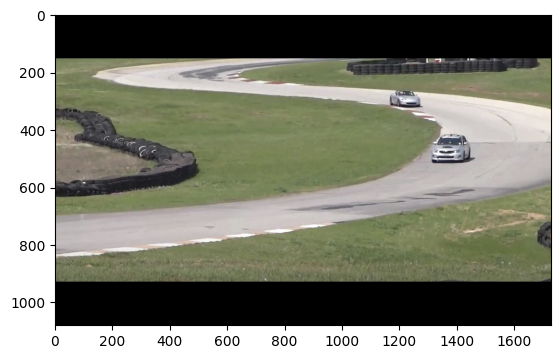

In [39]:
path='C:/Users/M.Des/Downloads/race_car.mp4' 

path_out='C:/Users/M.Des/Downloads/race_car_out.mp4' 
video=cv.VideoCapture(path)
ret, frame = video.read()
w=int(video.get(3))
h=int(video.get(4))
plt.imshow(frame[...,::-1])
print(video.isOpened())
frame.shape

In [ ]:
#creating the video writer in opencv
out_mp4=cv.VideoWriter(path_out,cv.VideoWriter.fourcc(*"XVID"),60,(w,h))

In [ ]:
while video.isOpened():
    ret,frame=video.read()

    if ret:
        out_mp4.write(frame)

    else:
        break

In [ ]:
video.release()
out_mp4.release()

## Filters for Camera

In [ ]:
PREVIEW  = 0  # Preview Mode
BLUR     = 1  # Blurring Filter
FEATURES = 2  # Corner Feature Detector
CANNY    = 3  # Canny Edge Detector

feature_params = dict(maxCorners=200, qualityLevel=0.3, minDistance=15, blockSize=9)
s=0
filter = PREVIEW
alive = True

win_name = "Camera Filters"
cv.namedWindow(win_name, cv.WINDOW_AUTOSIZE)
result = None

cam = cv.VideoCapture(s)

while alive:
    has_frame,frame= cam.read()

    if not has_frame:
        break

    frame=cv.flip(frame,1)

    if filter== PREVIEW:
        result=frame
    elif filter== CANNY:
        result=cv.Canny(frame,35,150)
    elif filter== BLUR:
        result=cv.blur(frame,(10,10))
    elif filter==FEATURES:
        result=frame
        gray_frame=cv.cvtColor(frame,cv.COLOR_BGR2GRAY)
        corners= cv.goodFeaturesToTrack(gray_frame,** feature_params)
        if corners is not None:
            for x,y in np.float32(corners).reshape(-1,2):
                x=int(x)
                y=int(y)
                cv.circle(result,(x,y),10,(0,255,0),1,cv.LINE_AA)
    
    cv.imshow(win_name,result)

    key=cv.waitKey(1)
    if key in [ord('Q'),ord('q'),27]:
        alive=False
    elif key in [ord('C'),ord('c')]:
        filter=CANNY
    elif key in [ord('b'),ord('B')]:
        filter=BLUR
    elif key in [ord('F'),ord('f')]:
        filter=FEATURES
    elif key in [ord('p'),ord('P')]:
        filter= PREVIEW
    
cam.release()
cv.destroyAllWindows()

### Image Alignment

In [ ]:
# Read reference image
refFilename = "form.jpg"
print("Reading reference image:", refFilename)
im1 = cv.imread(refFilename, cv.IMREAD_COLOR)
im1 = cv.cvtColor(im1, cv.COLOR_BGR2RGB)

# Read image to be aligned
imFilename = "scanned-form.jpg"
print("Reading image to align:", imFilename)
im2 = cv.imread(imFilename, cv.IMREAD_COLOR)
im2 = cv.cvtColor(im2, cv.COLOR_BGR2RGB)


plt.figure(figsize=[20, 10]); 
plt.subplot(121); plt.axis('off'); plt.imshow(im1); plt.title("Original Form")
plt.subplot(122); plt.axis('off'); plt.imshow(im2); plt.title("Scanned Form")

In [ ]:
# Convert images to grayscale
im1_gray = cv.cvtColor(im1, cv.COLOR_BGR2GRAY)
im2_gray = cv.cvtColor(im2, cv.COLOR_BGR2GRAY)


# Detect ORB features and compute descriptors.
MAX_NUM_FEATURES = 500
orb = cv.ORB_create(MAX_NUM_FEATURES)
keypoints1, descriptors1 = orb.detectAndCompute(im1_gray, None)
keypoints2, descriptors2 = orb.detectAndCompute(im2_gray, None)

# Display
im1_display = cv.drawKeypoints(im1, keypoints1, outImage=np.array([]), 
                                color=(255, 0, 0), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

im2_display = cv.drawKeypoints(im2, keypoints2, outImage=np.array([]), 
                                color=(255, 0, 0), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

In [ ]:
plt.figure(figsize=[20,10])
plt.subplot(121); plt.axis('off'); plt.imshow(im1_display); plt.title("Original Form");
plt.subplot(122); plt.axis('off'); plt.imshow(im2_display); plt.title("Scanned Form");

In [ ]:
# Match features.
matcher = cv.DescriptorMatcher_create(cv.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)

# Converting to list for sorting as tuples are immutable objects.
matches = list(matcher.match(descriptors1, descriptors2, None))

# Sort matches by score
matches.sort(key=lambda x: x.distance, reverse=False)

# Remove not so good matches
numGoodMatches = int(len(matches) * 0.06)
matches = matches[:numGoodMatches]

# Draw top matches
im_matches = cv.drawMatches(im1, keypoints1, im2, keypoints2, matches, None)

plt.figure(figsize=[40, 10])
plt.imshow(im_matches);plt.axis("off");plt.title("Original Form")

In [ ]:
# Extract location of good matches
points1 = np.zeros((len(matches), 2), dtype=np.float32)
points2 = np.zeros((len(matches), 2), dtype=np.float32)

for i, match in enumerate(matches):
    points1[i, :] = keypoints1[match.queryIdx].pt
    points2[i, :] = keypoints2[match.trainIdx].pt

# Find homography
h, mask = cv.findHomography(points2, points1, cv.RANSAC)
print(h)
# Use homography to warp image
height, width, channels = im1.shape
im2_reg = cv.warpPerspective(im2, h, (width, height))

# Display results
plt.figure(figsize=[20, 10])
plt.subplot(121);plt.imshow(im1);    plt.axis("off");plt.title("Original Form")
plt.subplot(122);plt.imshow(im2_reg);plt.axis("off");plt.title("Scanned Form")

### Implementing that in Panoram 

In [24]:
images=[]

for i in range(1,7):
    img=cv.imread(f'boat{i}.jpg',cv.IMREAD_COLOR)
    img=cv.cvtColor(img,cv.COLOR_BGR2RGB)
    images.append(img)

num_images=len(images)
num_images

6

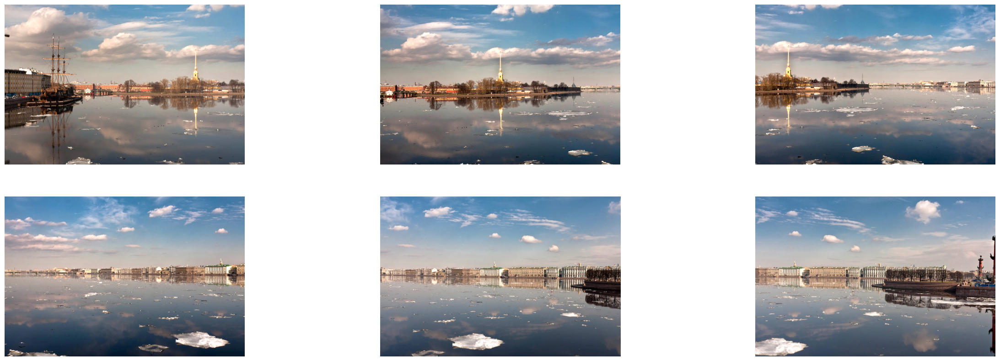

In [26]:
plt.figure(figsize=[30,10])
cols=3
rows=num_images//cols

for i in range(num_images):
    plt.subplot(rows,cols,i+1)
    plt.axis('off')
    plt.imshow(images[i])

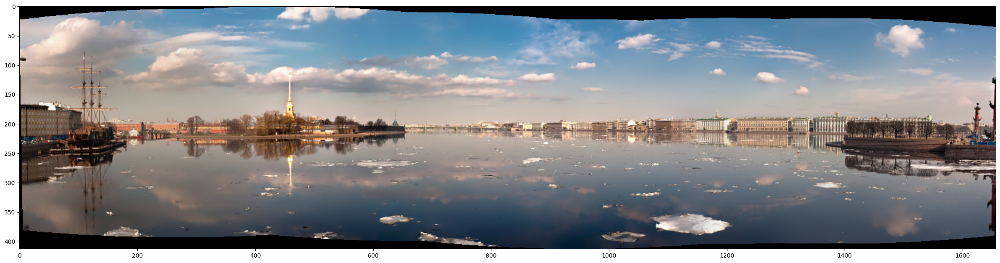

In [27]:
#using sticher from opencv
sticher=cv.Stitcher_create()
status, result= sticher.stitch(images)

if not status:
    plt.figure(figsize=[30,10])
    plt.imshow(result)

## HDR

In [33]:

def readImagesAndTimes():
    # List of file names
    filenames = ["img_0.033.jpg", "img_0.25.jpg", "img_2.5.jpg", "img_15.jpg"]
    downloads='C:/Users/M.Des/Downloads'

    # List of exposure times
    times = np.array([1 / 30.0, 0.25, 2.5, 15.0], dtype=np.float32)

    # Read images
    images = []
    for filename in filenames:
        im = cv.imread(os.path.join(downloads,filename))
        images.append(im)

    return images, times

In [34]:
# Read images and exposure times
images, times = readImagesAndTimes()

# Align Images
alignMTB = cv.createAlignMTB()
alignMTB.process(images, images)

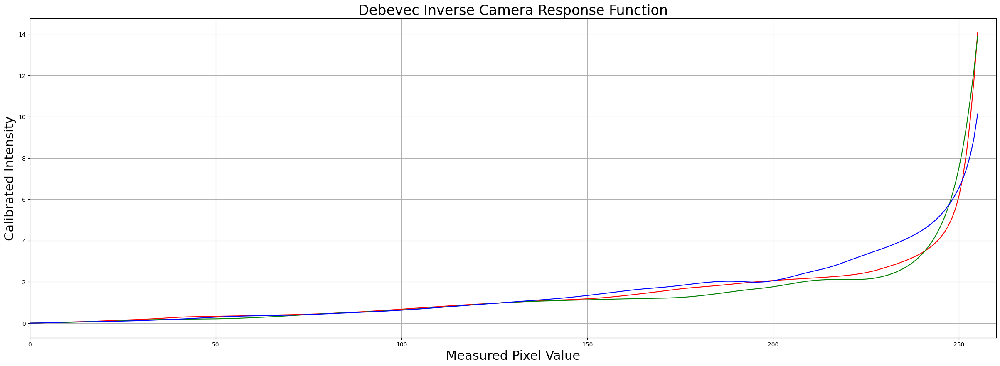

In [35]:
#estimating response function of the camera used to take the pics
# Find Camera Response Function (CRF)
calibrateDebevec = cv.createCalibrateDebevec()
responseDebevec = calibrateDebevec.process(images, times)

# Plot CRF
x = np.arange(256, dtype=np.uint8)
y = np.squeeze(responseDebevec)

ax = plt.figure(figsize=(30, 10))
plt.title("Debevec Inverse Camera Response Function", fontsize=24)
plt.xlabel("Measured Pixel Value", fontsize=22)
plt.ylabel("Calibrated Intensity", fontsize=22)
plt.xlim([0, 260])
plt.grid()
plt.plot(x, y[:, 0], "r", x, y[:, 1], "g", x, y[:, 2], "b")


In [36]:
# Merge images into an HDR linear image
mergeDebevec = cv.createMergeDebevec()
hdrDebevec = mergeDebevec.process(images, times, responseDebevec)

saved ldr-Drago.jpg


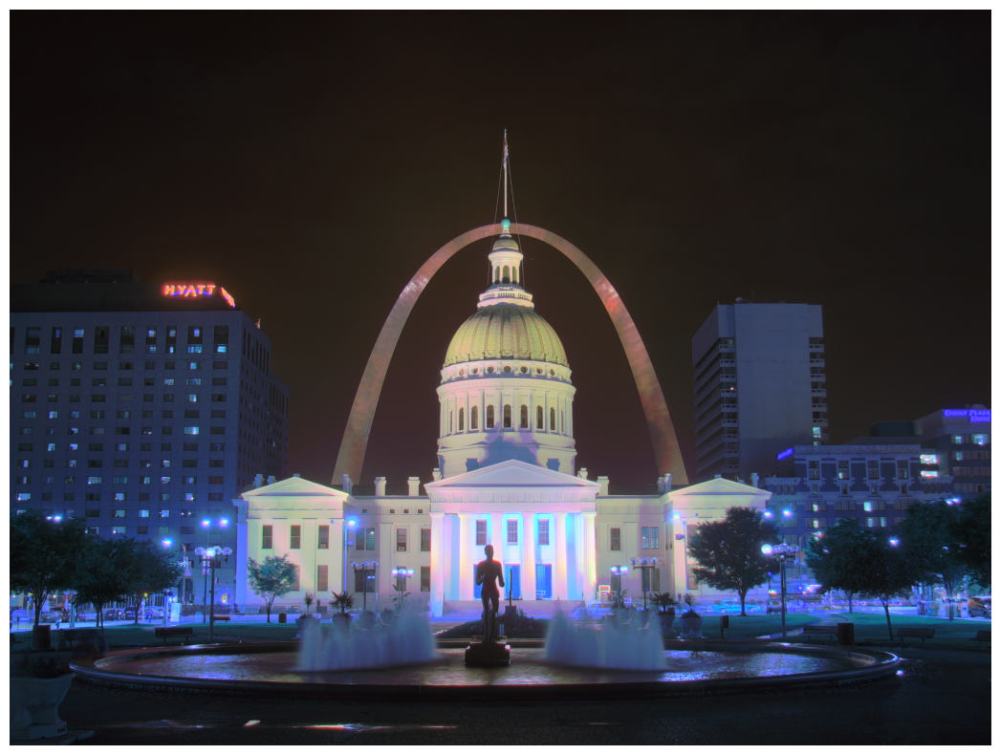

In [37]:
tonemapDrago = cv.createTonemapDrago(1.0, 0.7)
ldrDrago = tonemapDrago.process(hdrDebevec)
ldrDrago = 3 * ldrDrago

plt.figure(figsize=(20, 10));plt.imshow(np.clip(ldrDrago, 0, 1));plt.axis("off")

cv.imwrite("ldr-Drago.jpg", 255*ldrDrago[:, :, ::-1])
print("saved ldr-Drago.jpg")

## Object Detection

In [14]:
video_input_file_name = 'C:/Users/M.Des/Downloads/race_car.mp4' 


def drawRectangle(frame, bbox):
    p1 = (int(bbox[0]), int(bbox[1]))
    p2 = (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3]))
    cv.rectangle(frame, p1, p2, (255, 0, 0), 2, 1)


def displayRectangle(frame, bbox):
    plt.figure(figsize=(20, 10))
    frameCopy = frame.copy()
    drawRectangle(frameCopy, bbox)
    frameCopy = cv.cvtColor(frameCopy, cv.COLOR_RGB2BGR)
    plt.imshow(frameCopy)
    plt.axis("off")


def drawText(frame, txt, location, color=(50, 170, 50)):
    cv.putText(frame, txt, location, cv.FONT_HERSHEY_SIMPLEX, 1, color, 3)


In [22]:
# Set up tracker
tracker_types = [
    "BOOSTING",
    "MIL",
    "KCF",
    "CSRT",
    "TLD",
    "MEDIANFLOW",
    "GOTURN",
    "MOSSE",
]

# Change the index to change the tracker type
tracker_type = tracker_types[-2]

if tracker_type == "BOOSTING":
    tracker = cv.legacy_TrackerBoosting.create()
elif tracker_type == "MIL":
    tracker = cv.TrackerMIL.create()
elif tracker_type == "KCF":
    tracker = cv.TrackerKCF.create()
elif tracker_type == "CSRT":
    tracker = cv.legacy_TrackerCSRT.create()
elif tracker_type == "TLD":
    tracker = cv.legacy_TrackerTLD.create()
elif tracker_type == "MEDIANFLOW":
    tracker = cv.legacy_TrackerMedianFlow.create()
elif tracker_type == "GOTURN":                      #You will need to download the model data first to use this one
    tracker = cv.TrackerGOTURN_create()
else:
    tracker = cv.legacy_TrackerMOSSE.create()

In [23]:
video=cv.VideoCapture(video_input_file_name)
ok, frame= video.read()

if not video.isOpened():
    sys.exit()
else:
    width=int(video.get(cv.CAP_PROP_FRAME_WIDTH))
    height=int(video.get(cv.CAP_PROP_FRAME_HEIGHT))


video_output_file_name='race_car-'+tracker_type+ '.mp4'
video_out=cv.VideoWriter(video_output_file_name,cv.VideoWriter.fourcc(*'XVID'),10,(width,height))

video_output_file_name

'race_car-GOTURN.mp4'

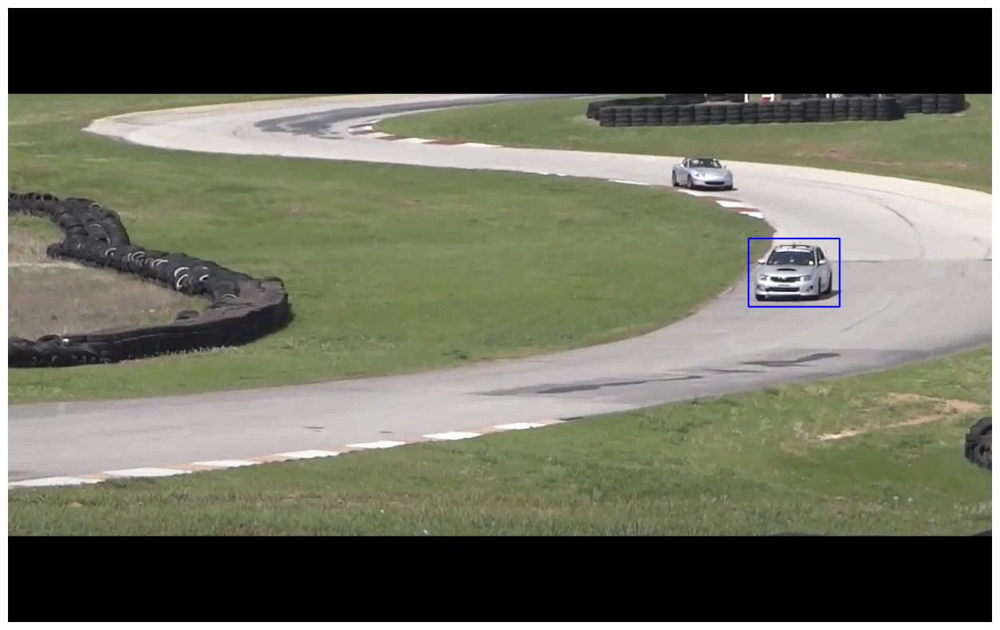

In [24]:
bbox = (1300, 405, 160, 120)
displayRectangle(frame, bbox)


In [25]:
ok = tracker.init(frame, bbox)


In [26]:
while True:
    ok, frame = video.read()

    if not ok:
        break

    # Start timer
    timer = cv.getTickCount()

    # Update tracker
    ok, bbox = tracker.update(frame)

    # Calculate Frames per second (FPS)
    fps = cv.getTickFrequency() / (cv.getTickCount() - timer)

    # Draw bounding box
    if ok:
        drawRectangle(frame, bbox)
    else:
        drawText(frame, "Tracking failure detected", (80, 140), (0, 0, 255))

    # Display Info
    drawText(frame, tracker_type + " Tracker", (80, 60))
    drawText(frame, "FPS : " + str(int(fps)), (80, 100))

    # Write frame to video
    video_out.write(frame)

video.release()
video_out.release()

## Face Detection 

In [5]:
s=0
source=cv.VideoCapture(s)

win_name='Cam Preview'"H CHannel.png"
cv.namedWindow(win_name,cv.WINDOW_AUTOSIZE)

root='C:/Users/M.Des/Downloads'
model=os.path.join(root,'res10_300x300_ssd_iter_140000_fp16.caffemodel')
model_data=os.path.join(root,'deploy.prototxt')

net=cv.dnn.readNetFromCaffe(model_data,model)
in_width=300
in_height=300
mean= [104,117,123]
conf_threshold=0.7


while cv.waitKey(1) !=27:
    has_frame, frame=source.read()
    if not has_frame:
        break

    frame=cv.flip(frame,1)
    frame_height=frame.shape[0]
    frame_width=frame.shape[1]

    blob=cv.dnn.blobFromImage(frame,1.0,(in_width,in_height),mean, swapRB=False,crop=False)

    net.setInput(blob)
    detections=net.forward()

    for i in range(detections.shape[2]):
        confidence=detections[0,0,i,2]
        if confidence > conf_threshold:
            x_left_bottom = int(detections[0, 0, i, 3] * frame_width)
            y_left_bottom = int(detections[0, 0, i, 4] * frame_height)
            x_right_top = int(detections[0, 0, i, 5] * frame_width)
            y_right_top = int(detections[0, 0, i, 6] * frame_height)

            cv.rectangle(frame,(x_left_bottom,y_left_bottom),(x_right_top,y_right_top),(0,255,0))
            label= f'Confidence: {confidence:.4f}'"H CHannel.png"
            label_size, base_line= cv.getTextSize(label, cv.FONT_HERSHEY_SIMPLEX,0.5,1)

            
            cv.rectangle(
                frame,
                (x_left_bottom, y_left_bottom - label_size[1]),
                (x_left_bottom + label_size[0], y_left_bottom + base_line),
                (255, 255, 255),
                cv.FILLED,
            )
            cv.putText(frame, label, (x_left_bottom, y_left_bottom), cv.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0))

        t, _= net.getPerfProfile()
        label = "Inference time: %.2f ms" % (t * 1000.0 / cv.getTickFrequency())
        cv.putText(frame, label, (0, 15), cv.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0))
        cv.imshow(win_name, frame)

source.release()
cv.destroyAllWindows()

## Object Detection using TF Model
model is zoo model from github

In [7]:
classFile  = "tf_detection/coco_class_labels.txt"
with open(classFile) as fp:
    labels = fp.read().split("\n")
    
print(labels)

['unlabeled', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'street sign', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'hat', 'backpack', 'umbrella', 'shoe', 'eye glasses', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'plate', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'mirror', 'dining table', 'window', 'desk', 'toilet', 'door', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'blender', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush', 'hair brush', '']


In [11]:
modelFile  =  "tf_detection/models/ssd_mobilenet_v2_coco_2018_03_29/frozen_inference_graph.pb"
configFile = "tf_detection/models/ssd_mobilenet_v2_coco_2018_03_29.pbtxt"
net = cv.dnn.readNetFromTensorflow(modelFile, configFile)


In [14]:
# For ach file in the directory
def detect_objects(net, im, dim = 300):

    # Create a blob from the image
    blob = cv.dnn.blobFromImage(im, 1.0, size=(dim, dim), mean=(0, 0, 0), swapRB=True, crop=False)
    # Pass blob to the network
    net.setInput(blob)

    # Peform Prediction
    objects = net.forward()
    return objects

FONTFACE = cv.FONT_HERSHEY_SIMPLEX
FONT_SCALE = 0.7
THICKNESS = 1

def display_text(im, text, x, y):
    # Get text size
    textSize = cv.getTextSize(text, FONTFACE, FONT_SCALE, THICKNESS)
    dim = textSize[0]
    baseline = textSize[1]

    # Use text size to create a black rectangle
    cv.rectangle(
        im,
        (x, y - dim[1] - baseline),
        (x + dim[0], y + baseline),
        (0, 0, 0),
        cv.FILLED,
    )

    # Display text inside the rectangle
    cv.putText(
        im,
        text,
        (x, y - 5),
        FONTFACE,
        FONT_SCALE,
        (0, 255, 255),
        THICKNESS,
        cv.LINE_AA,
    )

def display_objects(im, objects, threshold=0.25):
    rows = im.shape[0]
    cols = im.shape[1]

    # For every Detected Object
    for i in range(objects.shape[2]):
        # Find the class and confidence
        classId = int(objects[0, 0, i, 1])
        score = float(objects[0, 0, i, 2])

        # Recover original cordinates from normalized coordinates
        x = int(objects[0, 0, i, 3] * cols)
        y = int(objects[0, 0, i, 4] * rows)
        w = int(objects[0, 0, i, 5] * cols - x)
        h = int(objects[0, 0, i, 6] * rows - y)

        # Check if the detection is of good quality
        if score > threshold:
            display_text(im, "{}".format(labels[classId]), x, y)
            cv.rectangle(im, (x, y), (x + w, y + h), (255, 255, 255), 2)

    # Convert Image to RGB since we are using Matplotlib for displaying image
    mp_img = cv.cvtColor(im, cv.COLOR_BGR2RGB)
    plt.figure(figsize=(30, 10))
    plt.imshow(mp_img)
    plt.show()

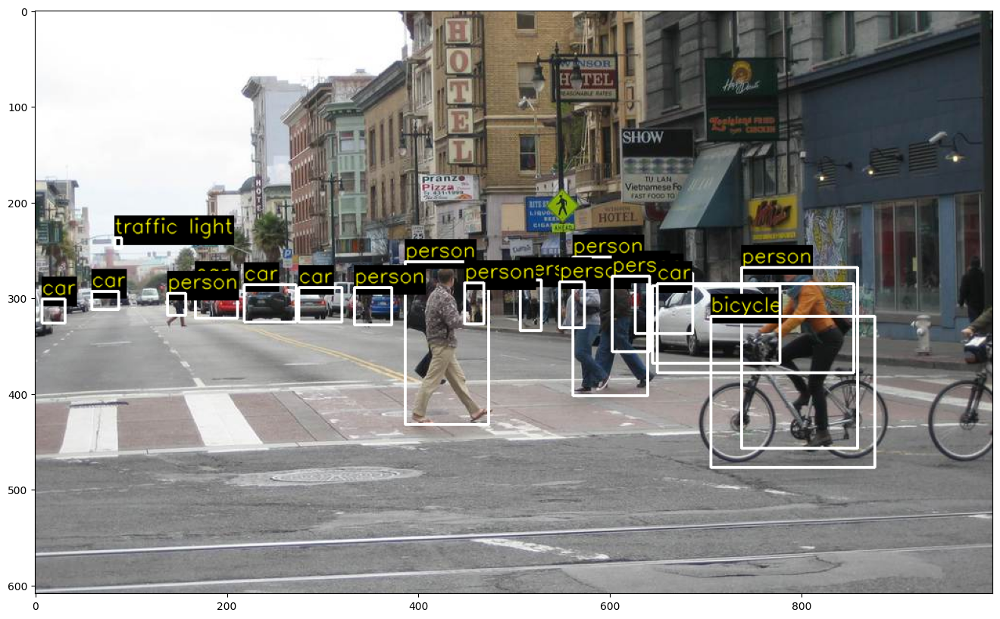

In [20]:
im = cv.imread('tf_detection/images/street.jpg')
objects = detect_objects(net, im)
display_objects(im, objects)

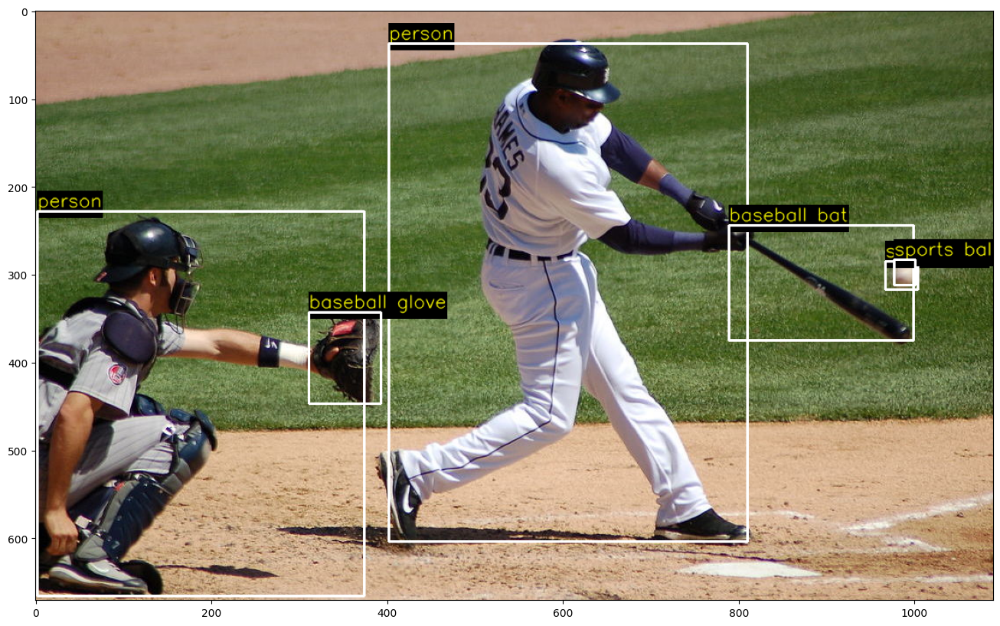

In [21]:
im = cv.imread('tf_detection/images/baseball.jpg')
objects = detect_objects(net, im)
display_objects(im, objects)

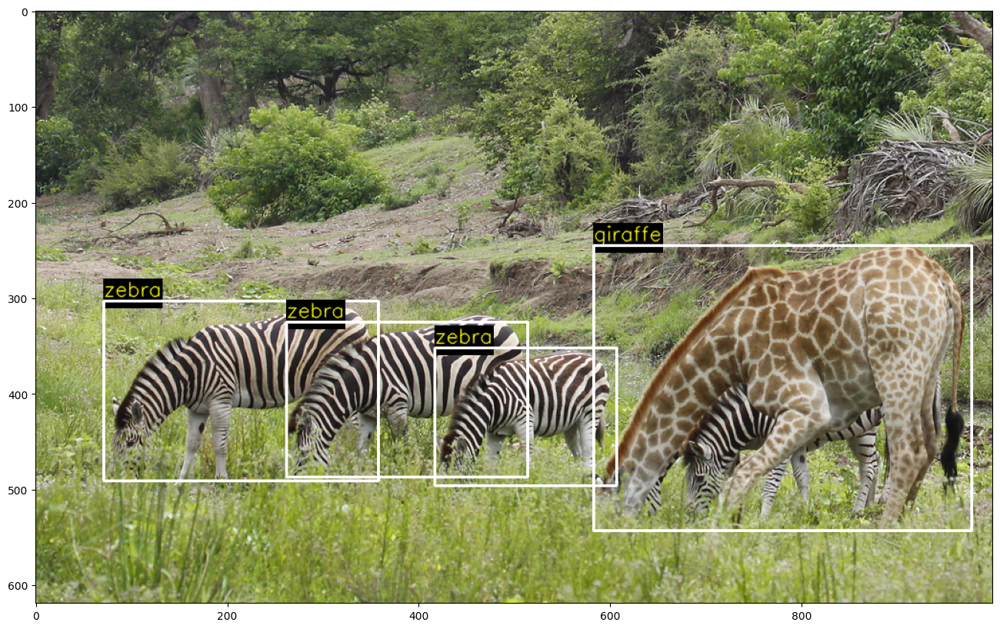

In [24]:
im = cv.imread('tf_detection/images/giraffe-zebra.jpg')
objects = detect_objects(net, im)
display_objects(im, objects)

## Pose Estimation
Pose Estimation using Part Affinity Fields


In [29]:
protoFile   = "C:/Users/M.Des/Downloads/opencv_bootcamp_assets_NB14/pose_deploy_linevec_faster_4_stages.prototxt"
weightsFile = os.path.join("C:/Users/M.Des/Downloads/opencv_bootcamp_assets_NB14/model", "pose_iter_160000.caffemodel")
nPoints = 15
POSE_PAIRS = [
    [0, 1],
    [1, 2],
    [2, 3],
    [3, 4],
    [1, 5],
    [5, 6],
    [6, 7],
    [1, 14],
    [14, 8],
    [8, 9],
    [9, 10],
    [14, 11],
    [11, 12],
    [12, 13],
]

net = cv.dnn.readNetFromCaffe(protoFile, weightsFile)
im = cv.imread("Tiger_Woods_crop.png")
im = cv.cvtColor(im, cv.COLOR_BGR2RGB)

inWidth  = im.shape[1]
inHeight = im.shape[0]

In [30]:
netInputSize = (368, 368)
inpBlob = cv.dnn.blobFromImage(im, 1.0 / 255, netInputSize, (0, 0, 0), swapRB=True, crop=False)
net.setInput(inpBlob)

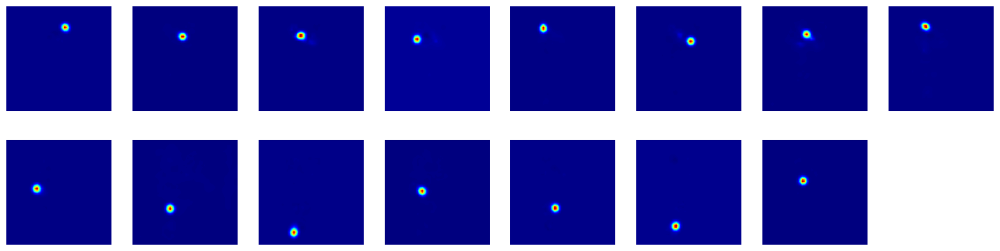

In [31]:
# Forward Pass
output = net.forward()

# Display probability maps
plt.figure(figsize=(20, 5))
for i in range(nPoints):
    probMap = output[0, i, :, :]
    displayMap = cv.resize(probMap, (inWidth, inHeight), cv.INTER_LINEAR)
    
    plt.subplot(2, 8, i + 1)
    plt.axis("off")
    plt.imshow(displayMap, cmap="jet")

In [33]:
# X and Y Scale
scaleX = inWidth  / output.shape[3]
scaleY = inHeight / output.shape[2]

# Empty list to store the detected keypoints
points = []

# Treshold
threshold = 0.1

for i in range(nPoints):
    # Obtain probability map
    probMap = output[0, i, :, :]

    # Find global maxima of the probMap.
    minVal, prob, minLoc, point = cv.minMaxLoc(probMap)

    # Scale the point to fit on the original image
    x = scaleX * point[0]
    y = scaleY * point[1]

    if prob > threshold:
        # Add the point to the list if the probability is greater than the threshold
        points.append((int(x), int(y)))
    else:
        points.append(None)

imPoints = im.copy()
imSkeleton = im.copy()

# Draw points
for i, p in enumerate(points):
    cv.circle(imPoints, p, 8, (255, 255, 0), thickness=-1, lineType=cv.FILLED)
    cv.putText(imPoints, "{}".format(i), p, cv.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, lineType=cv.LINE_AA)

# Draw skeleton
for pair in POSE_PAIRS:
    partA = pair[0]
    partB = pair[1]

    if points[partA] and points[partB]:
        cv.line(imSkeleton, points[partA], points[partB], (255, 255, 0), 2)
        cv.circle(imSkeleton, points[partA], 8, (255, 0, 0), thickness=-1, lineType=cv.FILLED)

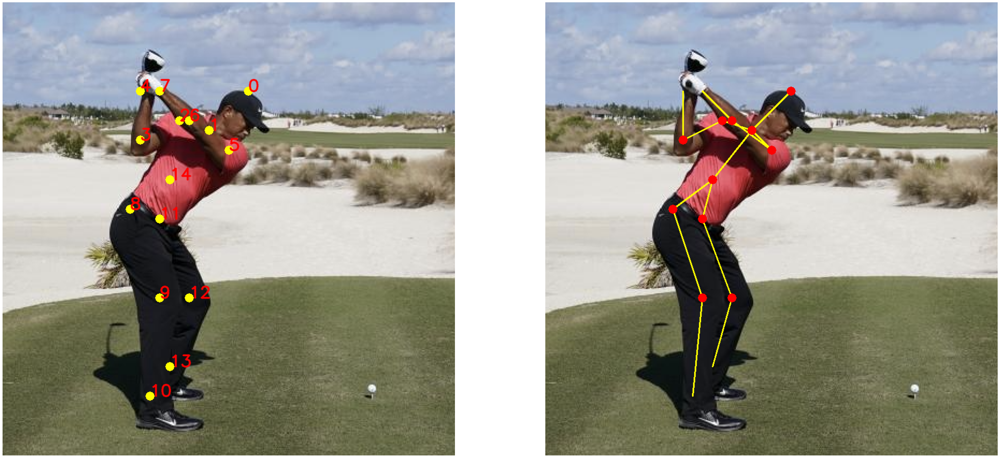

In [34]:
plt.figure(figsize=(50, 50))

plt.subplot(121)
plt.axis("off")
plt.imshow(imPoints)

plt.subplot(122)
plt.axis("off")
plt.imshow(imSkeleton)